In [ ]:
import torch
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader, random_split

In [ ]:
import torchvision
from torchvision import transforms, models

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
])

val_trans = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

In [ ]:
from pathlib import Path
from PIL import Image
img_paths = list(Path(r"D:\razliv").glob('*.JPG'))

In [ ]:
from pathlib import Path
# path_obj  = list(Path('drive/MyDrive/Nemezida UAV/Фото без отклонений/Объекты без отклонений').glob('*.JPG'))
# path_relief = list(Path('/content/drive/MyDrive/Nemezida UAV/Фото без отклонений/Рельеф').glob('*.JPG'))
# path_razl = list(Path('/content/drive/MyDrive/Nemezida UAV/Фото без отклонений/Скважины без разливов').glob('*.JPG'))
# img_paths = path_obj + path_relief + path_razl

In [5]:
import tqdm.notebook

In [6]:
def crop_save(img_paths, height=2000, width=2000, dim=(512,512)):
    for img_path in tqdm(img_paths):
        img = Image.open(img_path)
        for y in range(0, img.size[1], height):
            for x in range(0, img.size[0], width):
                box = (x, y, x+width, y+height)
                spam = img.crop(box)
                spam = spam.resize(dim)
                spam.save('D:/razliv_cropped/'+img_path.stem+f'_{x//width}_{y//height}'+img_path.suffix)

In [7]:
from tqdm.notebook import tqdm

In [9]:
import os
os.makedirs('D:/razliv_cropped', exist_ok=True)

In [10]:
if True:
    crop_save(img_paths)

In [14]:
fnames = list(Path('D:/razliv_cropped').glob('*.JPG'))

In [29]:
import matplotlib.pyplot as plt

In [30]:
done = []
error = []

In [11]:
path = Path('D:/razliv_cropped')

In [18]:
os.makedirs('classif/Razliv')

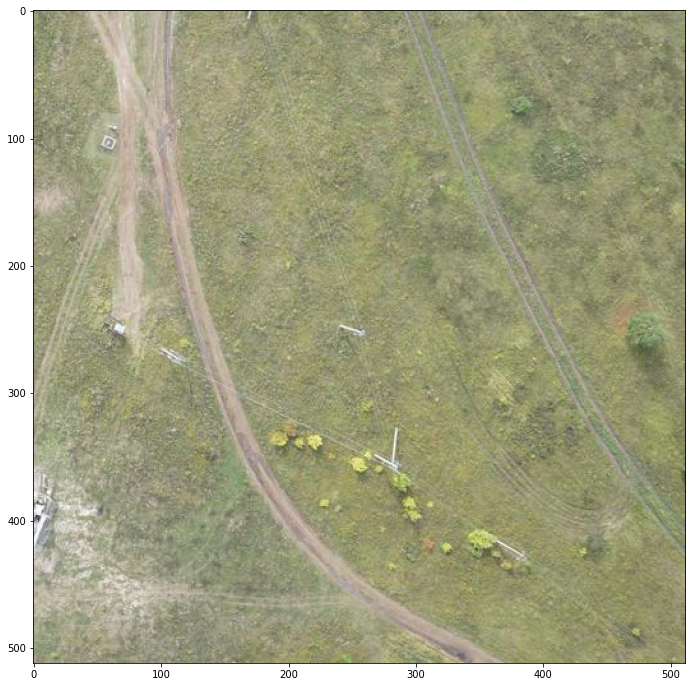

In [19]:
from IPython.display import clear_output
import matplotlib.pyplot as plt

for fname in fnames:
    clear_output(wait=False)
    img = Image.open(path / fname)
    plt.figure(figsize=(12,12))
    plt.imshow(img)
    plt.show()
    if input():
        img.save('classif/Razliv/' + fname.name)
    else:
        img.save('classif/BackG/' + fname.name)

### Dataloader

In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
from torchvision import transforms
from torchvision.transforms import functional as F
plt.style.use('ggplot')


class dataset(Dataset):
    def __init__(self, img_paths, transform):
        self.files = img_paths
        self.transform = transform
    def __getitem__(self, idx):
        img = Image.open(self.files[idx])
        return self.transform(img)
    def __len__(self):
        return len(self.files)

In [9]:
no_razliv = list(Path('D:/data/no_razliv').glob('*.JPG'))
objs = list(Path('D:/data/objs').glob('*.JPG'))
relief = list( Path('D:/data/relief').glob('*.JPG'))
img_paths = no_razliv + objs + relief

In [10]:
from sklearn.model_selection import train_test_split
train_paths, val_paths = train_test_split(no_razliv, test_size=0.2)

ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [ ]:
train_ds = dataset(train_paths, transform)
val_ds = dataset(val_paths, val_trans)

In [ ]:
train_dl = DataLoader(train_ds, shuffle=True, batch_size=16)
val_dl = DataLoader(val_ds, shuffle=False, batch_size=16)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available else 'cpu')

### NN Architecture

In [11]:
from torch import nn

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder1 = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=3, padding=2, dilation=2),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            
            nn.Conv2d(6, 6, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(6),
            nn.ReLU()
        )
        
        self.encoder2 = nn.Sequential(
            nn.Conv2d(6, 16, kernel_size=3, padding=2, dilation=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.Conv2d(16, 16, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
        )
        
        self.encoder3 = nn.Sequential(
            nn.Conv2d(16, 64, kernel_size=3, padding=2, dilation=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.Conv2d(64, 64, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
            
        self.decoder1 = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(64, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.Conv2d(16, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
        )
        
        self.decoder2 = nn.Sequential( 
            nn.Upsample(scale_factor=2),
            nn.Conv2d(16, 6, kernel_size=3, padding=1),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            
            nn.Conv2d(6, 6, kernel_size=3, padding=1),
            nn.BatchNorm2d(6),
            nn.ReLU()
        )
        
        self.decoder3 = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(6, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3),
            nn.ReLU(),
            
            nn.Conv2d(3, 3, kernel_size=3, padding=1),
        )
    def forward(self,x):
        x = self.encoder1(x)
        x = self.encoder2(x)
        x = self.encoder3(x)

        x = self.decoder1(x)
        x = self.decoder2(x)
        x = self.decoder3(x)
        return x

In [13]:
device = torch.device('cuda')

In [14]:
model = Autoencoder().to(device)

In [15]:
model = torch.load('autoencoder.save', map_location=device)

In [296]:
from torchsummary import summary
summary(model, (3, 512,512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 6, 512, 512]             168
       BatchNorm2d-2          [-1, 6, 512, 512]              12
              ReLU-3          [-1, 6, 512, 512]               0
            Conv2d-4          [-1, 6, 256, 256]             330
       BatchNorm2d-5          [-1, 6, 256, 256]              12
              ReLU-6          [-1, 6, 256, 256]               0
            Conv2d-7         [-1, 16, 256, 256]             880
       BatchNorm2d-8         [-1, 16, 256, 256]              32
              ReLU-9         [-1, 16, 256, 256]               0
           Conv2d-10         [-1, 16, 128, 128]           2,320
      BatchNorm2d-11         [-1, 16, 128, 128]              32
             ReLU-12         [-1, 16, 128, 128]               0
           Conv2d-13         [-1, 64, 128, 128]           9,280
      BatchNorm2d-14         [-1, 64, 1

In [298]:
import matplotlib.pyplot as plt
from IPython.display import clear_output 

In [299]:
# plot learning curves
def plot_lc(tr_loss, val_loss):
    fig, ax = plt.subplots(figsize=(8,8))
    ax.plot(tr_loss, label='Train loss')
    ax.plot(val_loss, label='Val loss')
    ax.set_xlabel('Num epoch')
    ax.set_ylabel('Loss')
    ax.legend()

In [300]:
def train(model, loss_fn, opt, num_epoch, train_dl, val_dl, steps=None, val_steps=None):
#     t = trange(num_epoch, unit='epoch')
    for epoch in range(num_epoch):
        epoch_loss = 0.
        for step, X_tr in enumerate(train_dl):
            if step == steps:
                break
                
            X_tr = X_tr.to(device)
            X_pred = model(X_tr)
            loss = loss_fn(X_pred, X_tr)
            epoch_loss += loss.item()
            
            opt.zero_grad()
            loss.backward()
            opt.step()
            
        tr_spam = epoch_loss / len(train_dl)
        tr_loss.append(tr_spam)
            
        with torch.no_grad():
            val_epoch_loss = 0.
            for val_step, X_val in enumerate(val_dl):
                if val_step == val_steps:
                    break
                    
                X_val = X_val.to(device)
                X_hat = model(X_val)
                val_epoch_loss += loss_fn(X_hat, X_val).item()
            
            val_spam = val_epoch_loss / len(val_dl)
            val_loss.append(val_spam)
#         t.set_description(f'{tr_spam:.3f}/{val_spam:.3f}')
        clear_output()
        plot_lc(tr_loss, val_loss)
        plt.show();

In [311]:
loss_fn = nn.MSELoss()
opt = torch.optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
model.cuda();

In [312]:
if True: 
    tr_loss, val_loss = [], []
train(model, loss_fn, opt, 100, train_dl, val_dl)

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

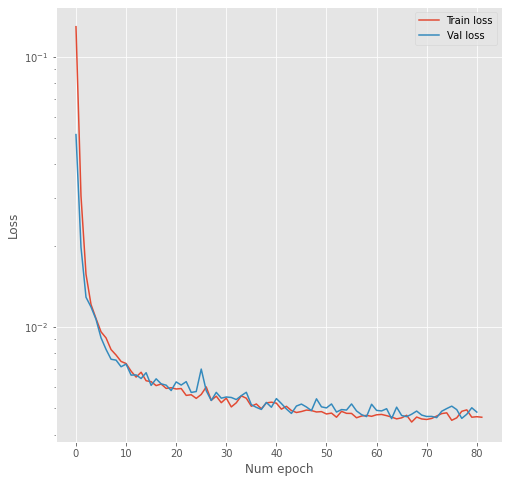

In [266]:
plot_lc(tr_loss, val_loss)
plt.yscale('log')

In [32]:
torch.nn.functional.mse_loss(pred, val[None, 2])

NameError: name 'pred' is not defined

In [17]:
pil = F.to_pil_image

In [16]:
x = val_trans(Image.open(r"C:\Users\Rodion\Downloads\Telegram Desktop\Подозрение на разливы\razliv\X\razliv11.JPG"))
y = Image.open(r"C:\Users\Rodion\Downloads\Telegram Desktop\Подозрение на разливы\razliv\y\razliv5.JPG").convert('L').resize((512,512))

In [20]:
model.cpu()

Autoencoder(
  (encoder1): Sequential(
    (0): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(6, 6, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (encoder2): Sequential(
    (0): Conv2d(6, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (encoder3): Sequential(
    (0): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3):

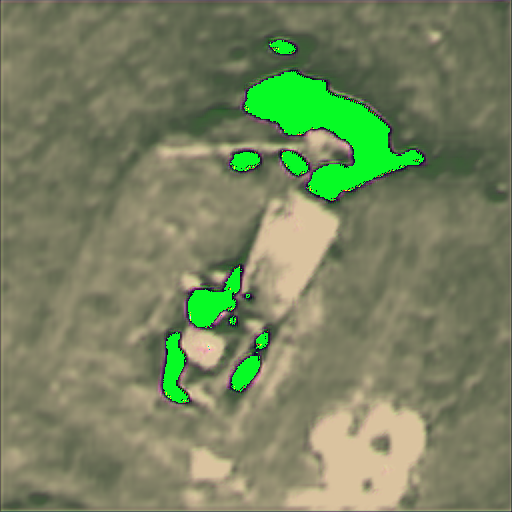

In [23]:
pil(model(x[None])[0])

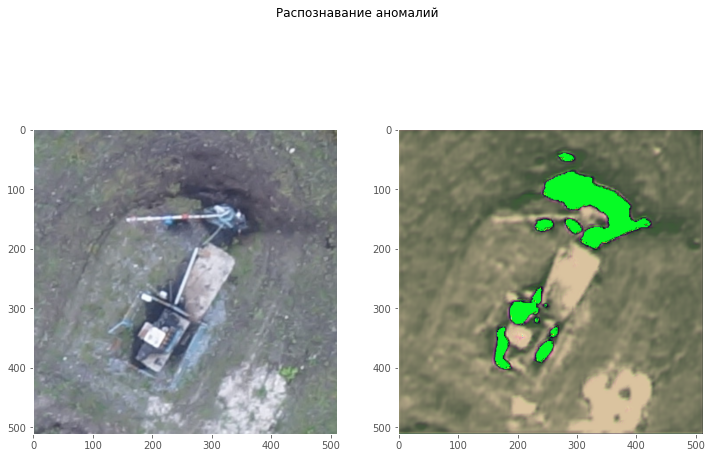

In [55]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,8))
fig.suptitle('Распознавание аномалий')
ax1.imshow(pil(x))
ax2.imshow(pil(model(x[None])[0]))
ax1.grid(False)
ax2.grid(False)

In [309]:
model.cpu();

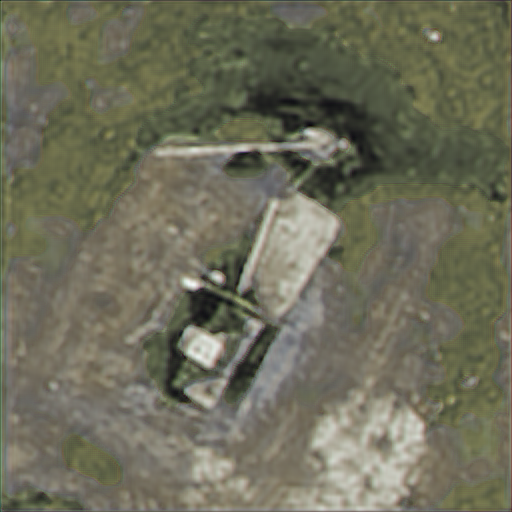

In [310]:
pil(model(x[None])[0])

In [131]:
x = x.resize((250, 300))

In [40]:
pil = F.to_pil_image

In [44]:
model.cpu()

Autoencoder(
  (encoder1): Sequential(
    (0): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(6, 6, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (encoder2): Sequential(
    (0): Conv2d(6, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (encoder3): Sequential(
    (0): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3):

In [45]:
with torch.no_grad():
    pred = model(x[None, :])[0]

In [114]:
from sklearn.preprocessing import minmax_scale

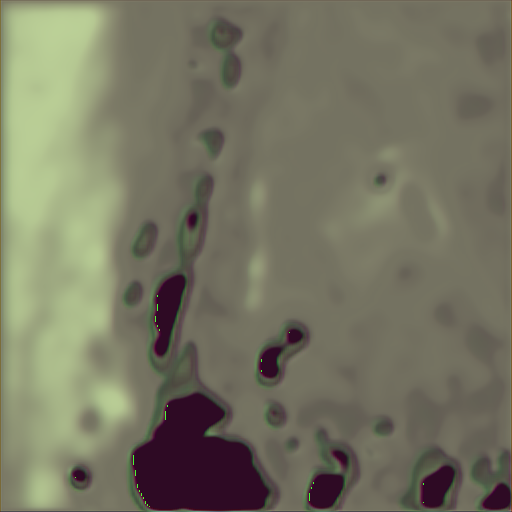

In [47]:
pil(pred)

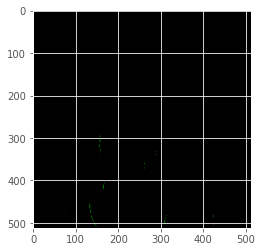

In [46]:
plt.imshow(pred.lt(0).numpy().transpose(1,2,0)*255)

In [319]:
pred = model(val_trans(x)[None, :])[0]

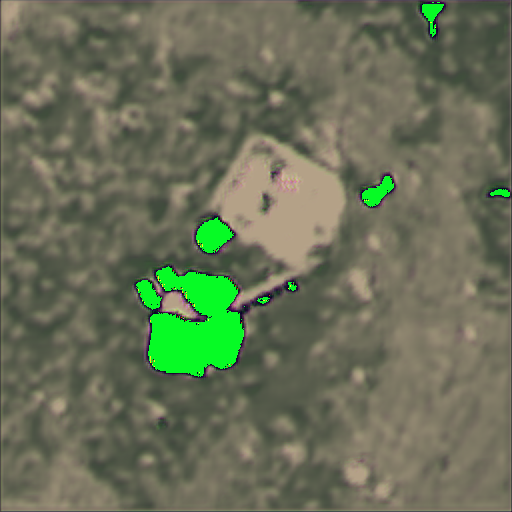

In [322]:
pil(pred)

In [158]:
torch.empty(6, 3, 512, 512)

torch.Size([6, 3, 512, 512])

In [159]:
def split_img(img_path, height=2000, width=2000, dim=(512,512)):
    img = Image.open(img_path)
    out_img = torch.empty(6, 3, 512, 512)
    k = 0
    for y in range(0, img.size[1], height):
        for x in range(0, img.size[0], width):
            box = (x, y, x+width, y+height)
            patch = img.crop(box)
            patch = val_trans(patch)
            out_img[k, ...] = patch
            k += 1   
    return out_img

In [289]:
def cat_imgs(imgs):
    upper = torch.cat((*imgs[:3],), 2)
    down = torch.cat((*imgs[3:],), 2)
    return torch.cat((upper, down), 1)

In [ ]:
img = F.to_tensor(Image.open(r"C:\Users\Rodion\Downloads\Telegram Desktop\Подозрение на разливы\Подозрение на разливы (15).JPG").resize((2000,2000)))

In [ ]:
pred = model(img[None, :])[0]

Error in callback <function flush_figures at 0x0000016BE253D550> (for post_execute):


KeyboardInterrupt: 

In [ ]:
pilpred

In [295]:
path = r"C:\Users\Rodion\Downloads\Telegram Desktop\Подозрение на разливы\Подозрение на разливы (15).JPG"
imgs = split_img(path)

In [296]:
preds = model(imgs)

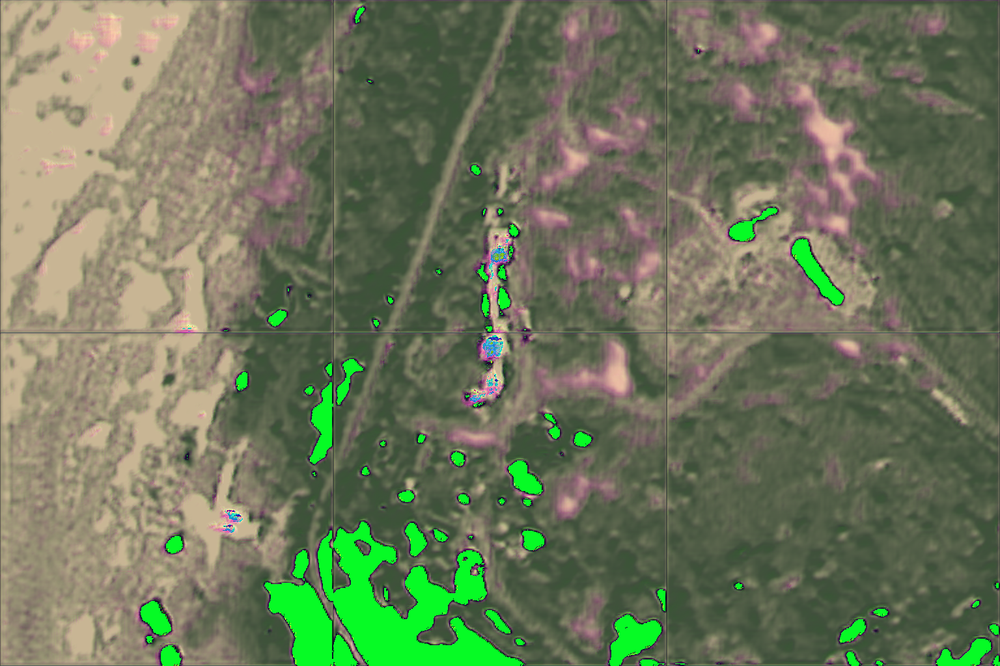

In [298]:
pil(cat_imgs(preds))

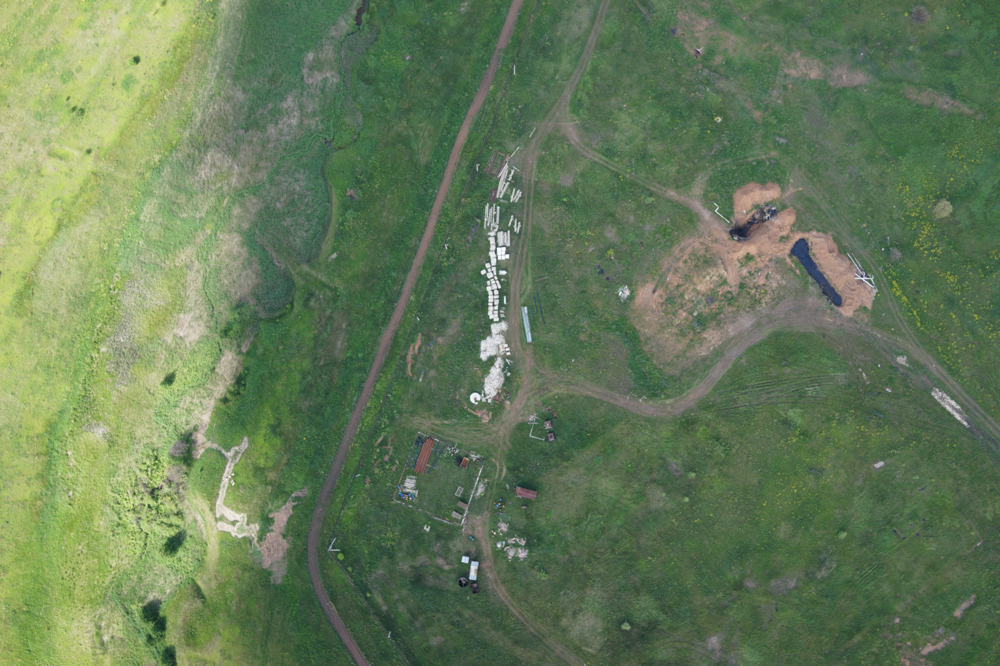

In [302]:
pil(cat_imgs(imgs))

In [ ]:
def trans_pred(imgs):
    out_imgs = torch.empty(3, 512*3, 512*2):
        for x in imgs

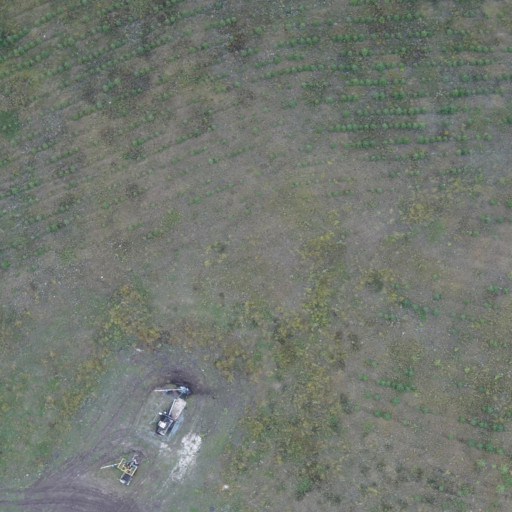

In [232]:
pil(imgs[1])

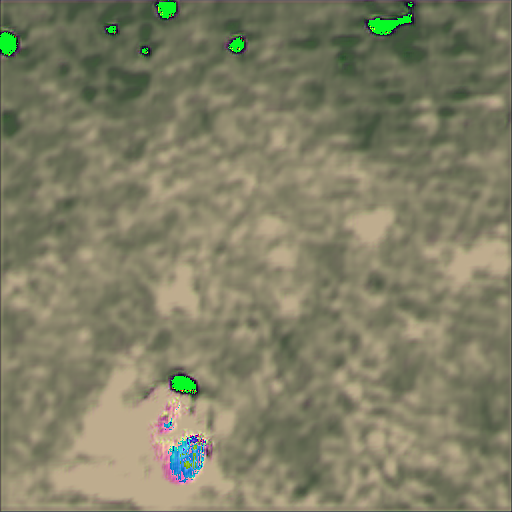

In [233]:
pil(preds[1])

In [ ]:
def inf_pred(img_path, height=2000, width=2000, dim=(512,512)):
    img = Image.open(img_path)
    for i in range()

In [87]:
pred1 = minmax_scale(pred[2].numpy().ravel()).reshape(512, 512)

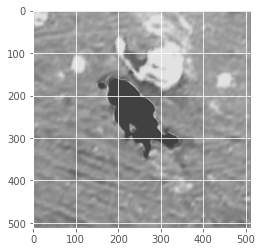

In [90]:
plt.imshow(pred1, cmap='gray')

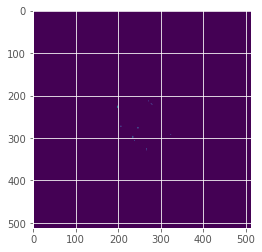

In [78]:
plt.imshow(pred.mean(0).numpy())

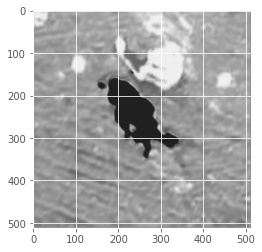

In [65]:
plt.imshow(pred1.mean(2), cmap='gray')

In [ ]:
from sklearn.

In [37]:
pred.min()

tensor(-0.1318, grad_fn=<MinBackward1>)

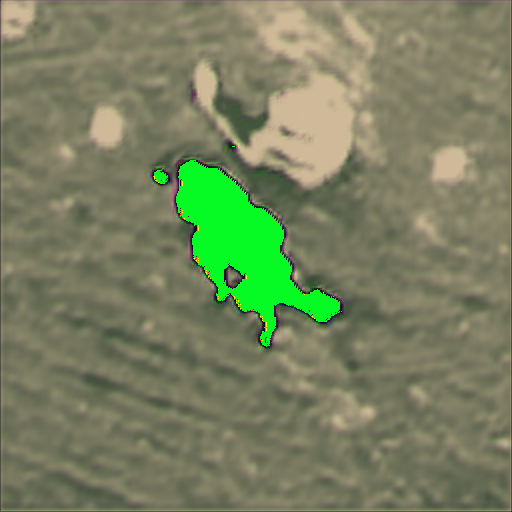

In [33]:
pil(pred<)

In [150]:
from sklearn.cluster import KMeans

In [151]:
km = KMeans(2).fit(pred.sigmoid().detach().reshape(3, -1).numpy().transpose())

In [154]:
from sklearn.ensemble import IsolationForest

In [155]:
pred1 = IsolationForest().fit_predict(pred.sigmoid().detach().reshape(3, -1).numpy().transpose())

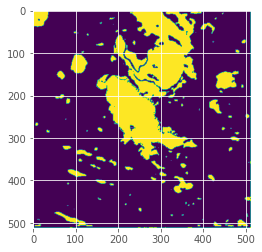

In [157]:
plt.imshow(pred1.reshape(512,512)<1)

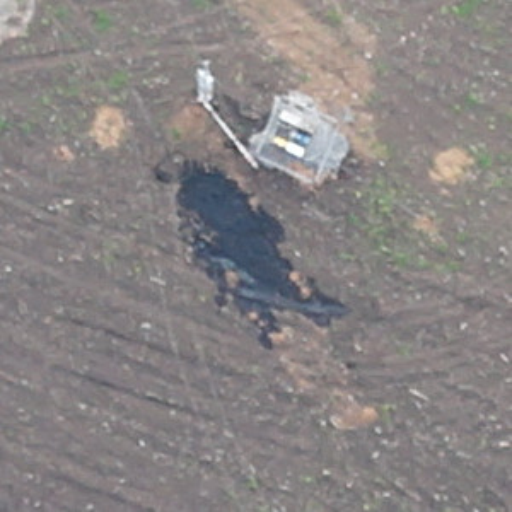

In [152]:
pil(x)

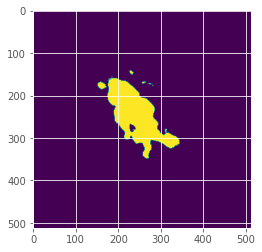

In [153]:
plt.imshow(km.labels_.reshape(512,512))

In [58]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte() # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded  # 

In [72]:
import numpy as np
y_true = (np.array(y) // 255).ravel()

In [69]:
y_pred = km.labels_

In [90]:
(((y_pred & y_true) + 1e-8) / ((y_pred | y_true) + 1e-8)).mean()

0.944713593082161

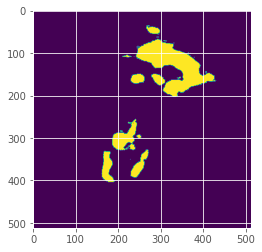

In [93]:
plt.imshow(y_pred.reshape(512,512))

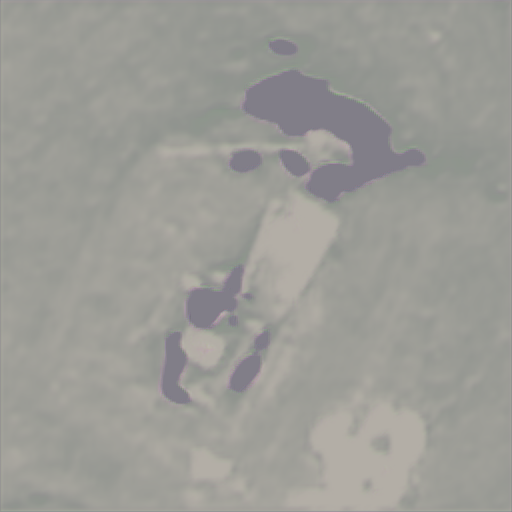

In [44]:
pred.sigmoid()

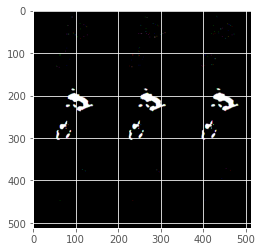

In [42]:
plt.imshow((pred.sigmoid().detach().numpy().ravel() < 0.5).astype(int).reshape(512,512,3)*255)

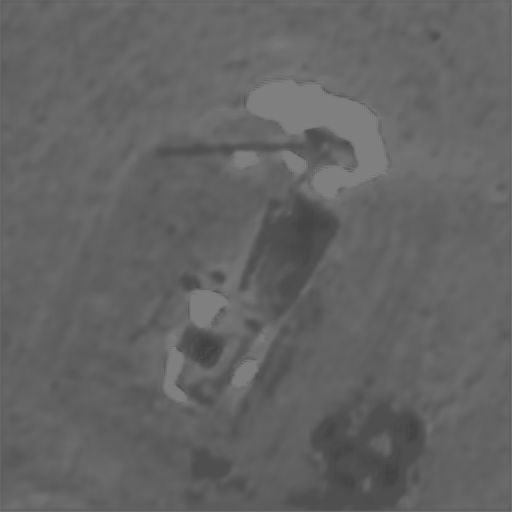

In [181]:
pil(-pred.sigmoid()[0])

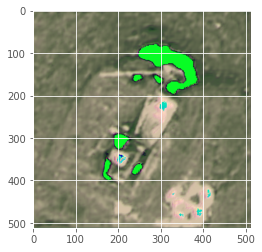

In [182]:
plt.imshow(pil(pred))

In [183]:
res = (pred - x).detach().numpy()

In [184]:
from sklearn.cluster import KMeans

In [192]:
hm = res.reshape(3, -1).transpose()

In [185]:
km = KMeans(n_clusters=2, random_state=0).fit(res.reshape(3, -1).transpose())

In [154]:
from sklearn.ensemble import IsolationForest
isol = IsolationForest()

In [162]:
clust = isol.fit_predict(pred.detach().numpy().reshape(3, -1).transpose())

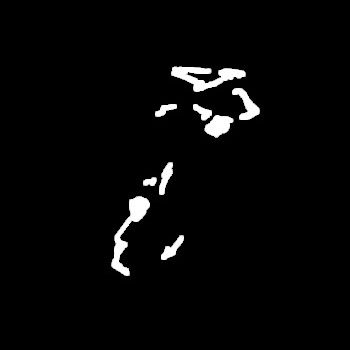

In [188]:
from sklearn.covariance import EllipticEnvelope as Elip

In [246]:
from sklearn.svm import OneClassSVM

In [ ]:
svm = OneClassSVM().fit(hm)

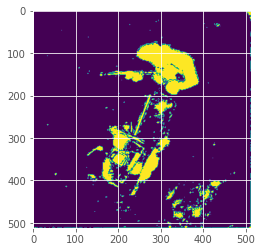

In [201]:
plt.imshow(pred1.reshape(512,512) < 0)

In [216]:
from sklearn.metrics import mean_squared_error
mean_squared_error(transform(y)[0], km.labels_.reshape(512,512))

0.07153925253132594

In [229]:
np.array(y)[...,2].sum()

877598

In [211]:
transform(y)[2]

tensor(7367.2197)

In [241]:
np.array(y).ravel().shape

(122500,)

In [245]:
mean_squared_error(pred1 < 0, np.array(y.resize((512,512))).ravel()/255)

0.08169432056724728

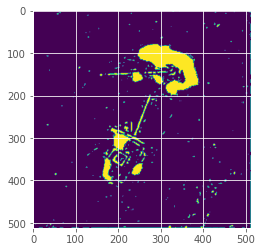

In [231]:
plt.imshow(km.labels_.reshape(512,512))

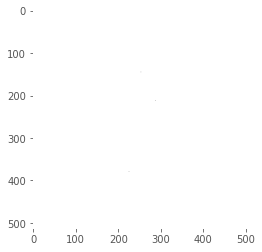

In [116]:
plt.imshow((res[2].ravel()).reshape(512,512), cmap='gray')

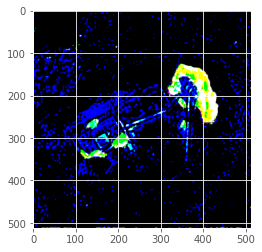

In [86]:
plt.imshow((pred - x < -0.2).numpy().astype('int8').transpose(2, 1, 0)*255)

In [62]:
plt.imshow(pil((pred - x)))

TypeError: Input type bool is not supported

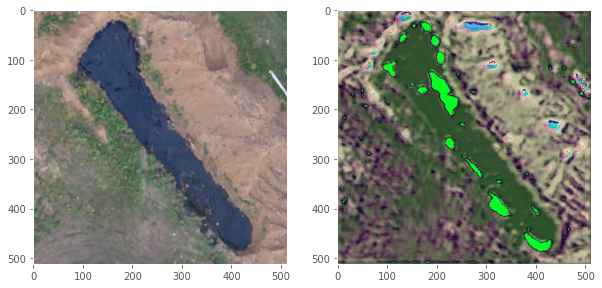

In [50]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(pil(x))
plt.grid()

plt.subplot(1, 2, 2)
plt.imshow(pil(pred), cmap='gray')
plt.grid()

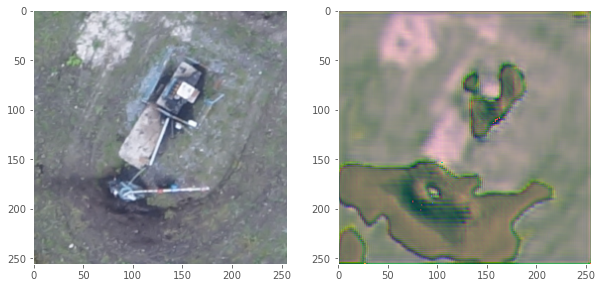

In [50]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(pil(x))
plt.grid()

plt.subplot(1, 2, 2)
plt.imshow(pil(pred), cmap='gray')
plt.grid()

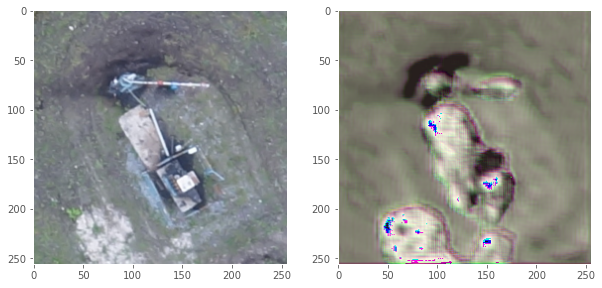

In [46]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(pil(x))
plt.grid()

plt.subplot(1, 2, 2)
plt.imshow(pil(pred), cmap='gray')
plt.grid()

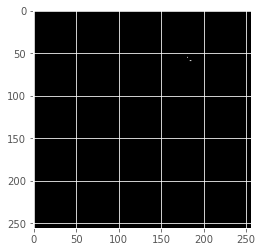

In [98]:
plt.imshow((pred < 0).numpy().astype(int).mean(0)*255, cmap='gray')

In [312]:
import numpy as np

In [313]:
a = (x- pred).detach().numpy()

In [314]:
q1 = np.quantile(a, 0.25)
q3 = np.quantile(a, 0.75)

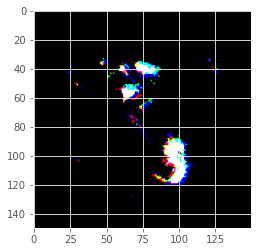

In [348]:
plt.imshow( (a > q3 + 1.5 * (q3-q1)).transpose(1, 2, 0).astype(int)*255 )